# The diffusion equation
Numerical solution of the 1D diffusion problem
$$ \frac{\partial N}{\partial t} =  k \frac{\partial^2 N}{\partial x^2}$$ 
using an explicit scheme

$N(x,t)$ represents the evolution of the dissolved nitrogen (DIN) concentration along the estuary over time

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
# constants
SECPERDAY = 86400.
M2KM = 1000

## User defined parameters

In [2]:
# problem parameters
kappa=1.0e3   # Eddy diffusion coefficient [m2 s-1]
dx=500         # X resolution [m]
dt=100         # time step [s]
t0=0.          # initial time
tmax=0.12      # duration of simulation [days]
xmax=10.0e3    # length of the basin [m]

# Parameters of the initial DIN spillage
N0 = 20.       # baseline concentration [mmol/m3]
sigma = 1000.  # width [m]
A = 100.       # amplitude [mmol/m3]

## Initial function and grid specifications
The initial shape of the temperature distribution is a Gaussian peak function

In [3]:
# Spatial shape of the initial DIN concentration
def Gaussian(x):
    y = N0+A*np.exp(-(x/sigma)**2)
    return y

The resulting space-time grid depends on the parameters above. The non-dimensional Courant number must be smaller than 0.5 for conditional stability.

In [4]:
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
N = np.zeros([IM,NT])   # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical diffusion DX^2/DT = ',dx**2/dt,' m2/s')
print('Physical diffusion = ',kappa,' m2/s')
print('Courant number (diffusion) = ',kappa*dt/(dx**2))

Grid steps :  40
Number of time steps :  104
Timestep =  100  s
Max numerical diffusion DX^2/DT =  2500.0  m2/s
Physical diffusion =  1000.0  m2/s
Courant number (diffusion) =  0.4


## Numerical solution
Note that this code stores the solution at all times in array N for educational purposes. This allows to plot the solution at the different time steps and see how it evolves.

*This method is very inefficient for any application because it uses a lot of memory. In modern computer codes only a few time records are hold in memory. The instantaneous solution is often temporarely stored for computing time averages and then discarded.*

This part of the code is the topic of one question found in the lecture notes

In [5]:
# Compute the numerical solution using a time loop over the number of time steps
N[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1):
    # Question 2
    N[0,n+1]  = N[1,n]
    N[-1,n+1] = N[-2,n]
    # discretization of the second derivative
    rhs = kappa*(N[:-2,n]-2*N[1:-1,n]+N[2:,n])/(dx**2)
    N[1:-1,n+1] = N[1:-1,n] + rhs*dt    

## Plot the result using a matplotlib animation
The animation below displays the evolution of the solution and compares it with the initial condition

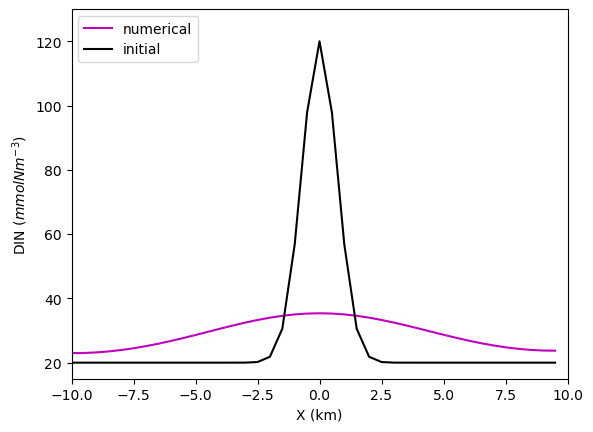

In [6]:
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/M2KM, xmax/M2KM, N0-5, N0+A+10])
# first plot the initial condition and set the line attributes
sol, = ax.plot(x/M2KM, N[:,0],'m',label='numerical')
line, = ax.plot(x/M2KM, Gaussian(x),'k',label='initial')
ax.set_xlabel('X (km)')
ax.set_ylabel('DIN ($mmol N m^{-3}$)')
plt.legend(loc='upper left')

def animate(i):
    sol.set_ydata(N[:,i])  # update the numerical solution
    return sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

In [7]:
N_dirichlet = np.zeros([IM, NT])

# initial condition
N_dirichlet[:, 0] = Gaussian(x)

for n in range(NT-1):

    # Dirichlet boundary conditions
    N_dirichlet[0, n+1] = N0
    N_dirichlet[-1, n+1] = N0

    # diffusion equation
    rhs = kappa*(N_dirichlet[:-2, n] 
                 - 2*N_dirichlet[1:-1, n] 
                 + N_dirichlet[2:, n])/(dx**2)

    N_dirichlet[1:-1, n+1] = N_dirichlet[1:-1, n] + rhs*dt

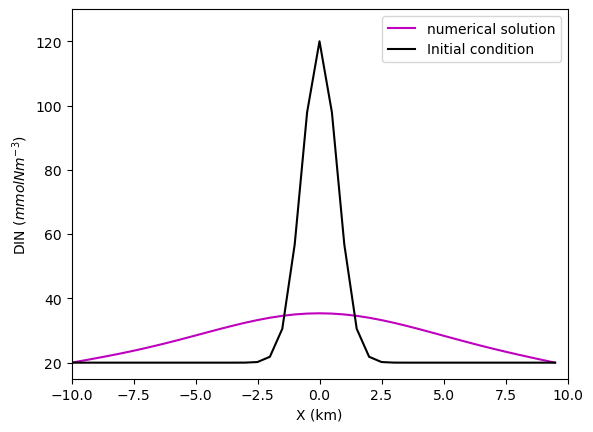

In [8]:
from IPython.display import HTML

fig, ax = plt.subplots()

plt.axis([-xmax/M2KM, xmax/M2KM, N0-5, N0+A+10])
plt.autoscale(False)

# Dirichlet numerical solution
line, = ax.plot(x/M2KM, N_dirichlet[:, 0], 'm', label='numerical solution')

# initial condition, like in the notebook
initial, = ax.plot(x/M2KM, Gaussian(x), 'k', label='Initial condition')

ax.set_xlabel('X (km)')
ax.set_ylabel('DIN ($mmol N m^{-3}$)')
ax.legend()

def animate(i):
    line.set_ydata(N_dirichlet[:, i])
    return line,

ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True
)

HTML(ani.to_jshtml())

In [9]:
kappa2 = 2.0e3

N_kappa2 = np.zeros([IM, NT])

# initial condition
N_kappa2[:, 0] = Gaussian(x)

for n in range(NT-1):

    # Neumann boundary conditions
    N_kappa2[0, n+1] = N_kappa2[1, n]
    N_kappa2[-1, n+1] = N_kappa2[-2, n]

    # diffusion equation
    rhs = kappa2*(N_kappa2[:-2, n] 
                  - 2*N_kappa2[1:-1, n] 
                  + N_kappa2[2:, n])/(dx**2)

    N_kappa2[1:-1, n+1] = N_kappa2[1:-1, n] + rhs*dt

print('Diffusion number =', kappa2*dt/(dx**2))

Diffusion number = 0.8


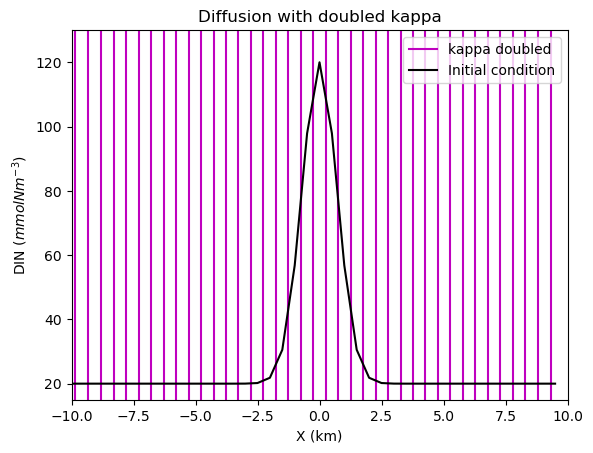

In [10]:
fig, ax = plt.subplots()

plt.axis([-xmax/M2KM, xmax/M2KM, N0-5, N0+A+10])
plt.autoscale(False)

line, = ax.plot(x/M2KM, N_kappa2[:, 0], 'm', label='kappa doubled')
initial, = ax.plot(x/M2KM, Gaussian(x), 'k', label='Initial condition')

ax.set_xlabel('X (km)')
ax.set_ylabel('DIN ($mmol N m^{-3}$)')
ax.set_title('Diffusion with doubled kappa')
ax.legend()

def animate(i):
    line.set_ydata(N_kappa2[:, i])
    return line,

ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True
)

HTML(ani.to_jshtml())

In [11]:
# Fix the instability by reducing dt

dt2 = 50
NT2 = int(np.floor(tmax*86400/dt2)) + 1

N_fixed = np.zeros([IM, NT2])

# initial condition
N_fixed[:, 0] = Gaussian(x)

for n in range(NT2-1):

    # Neumann boundary conditions
    N_fixed[0, n+1] = N_fixed[1, n]
    N_fixed[-1, n+1] = N_fixed[-2, n]

    # diffusion equation
    rhs = kappa2*(N_fixed[:-2, n] 
                  - 2*N_fixed[1:-1, n] 
                  + N_fixed[2:, n])/(dx**2)

    N_fixed[1:-1, n+1] = N_fixed[1:-1, n] + rhs*dt2

print('Fixed diffusion number =', kappa2*dt2/(dx**2))

Fixed diffusion number = 0.4


In [ ]:
fig, ax = plt.subplots()

plt.axis([-xmax/M2KM, xmax/M2KM, N0-5, N0+A+10])
plt.autoscale(False)

line, = ax.plot(x/M2KM, N_fixed[:, 0], 'm', label='fixed run')
initial, = ax.plot(x/M2KM, Gaussian(x), 'k', label='Initial condition')

ax.set_xlabel('X (km)')
ax.set_ylabel('DIN ($mmol N m^{-3}$)')
ax.set_title('Doubled kappa fixed with smaller dt')
ax.legend()

def animate(i):
    line.set_ydata(N_fixed[:, i])
    return line,

ani = animation.FuncAnimation(
    fig, animate, interval=dt2, blit=True, frames=NT2, repeat=True
)

HTML(ani.to_jshtml())

## Question 1

- The peak flattens quickly at the beginning because the concentration difference is still large. The centre of the DIN patch has a much higher concentration than the sides, so diffusion is strong at first. As time goes on, the DIN spreads out and the peak becomes flatter. This means the concentration difference becomes smaller, so diffusion becomes weaker. That is why the peak still spreads, but it spreads more slowly with time.

## Question 2

- the boundary value is copied from the nearest point inside the domain, so the left boundary follows the point next to it, and the right boundary also follows the point next to it

- the Neumann boundary is more realistic here because it does not force a fixed concentration at the edge. It lets the boundary follow the nearby interior value

## Question 3

- When I doubled kappa from 1000 to 2000, the DIN patch spread out faster, because kappa controls how strong the diffusion or mixing is.

- the model became unstable when I doubled kappa, it started behaving unrealistically because the time step was now too large for the stronger diffusion.

- To fix this, I reduced the time step from 100 seconds to 50 seconds. After reducing the time step, the model became stable again.

I used AI to help write codes